In [1]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import numpy as np
import plotly as py
from plotly.offline import iplot
py.offline.init_notebook_mode(connected=True)

%matplotlib inline

In [2]:
data_dict = {1:{"tokens":[], "text": ""}, 0:{"tokens":[], "text": ""}} #questo dizionario conterrà i diversi dati nella struttura definita

In [27]:
df = pd.read_csv("test_test_all.csv", sep='\t')
df.head()

,variation,verified_reviews,rating,date,feedback
0,Echo 4th Gen,This is an honest review and comparison of the...,5,"April 6, 2021",1
1,Echo 4th Gen,A friend of mine recently gave me an echo. 2nd...,5,"October 29, 2022",1
2,Echo 4th Gen,The new Echo 4th Gen is a big change in aesthe...,4,"December 15, 2020",1
3,Echo 4th Gen,I got the Echo out of curiosity after hearing ...,5,"November 9, 2022",1
4,Echo 4th Gen,"I already had an echo, I added a sub about 3 m...",5,"November 8, 2022",1


In [4]:
df.drop(df.columns[0],axis=1,inplace=True)

In [28]:
#Shape
df.shape

(32874, 5)

In [29]:
df

,variation,verified_reviews,rating,date,feedback
0,Echo 4th Gen,This is an honest review and comparison of the...,5,"April 6, 2021",1
1,Echo 4th Gen,A friend of mine recently gave me an echo. 2nd...,5,"October 29, 2022",1
2,Echo 4th Gen,The new Echo 4th Gen is a big change in aesthe...,4,"December 15, 2020",1
3,Echo 4th Gen,I got the Echo out of curiosity after hearing ...,5,"November 9, 2022",1
4,Echo 4th Gen,"I already had an echo, I added a sub about 3 m...",5,"November 8, 2022",1
...,...,...,...,...,...
32869,Echo Studio,As far as sound quality this is a great purcha...,3,"March 18, 2021",1
32870,Echo Studio,"Alexa worked fine for years, I changed nothing...",1,"October 9, 2020",0
32871,Echo Studio,"Right now, it has a long lead time. I ordered...",3,"January 5, 2022",1
32872,Echo Studio,Speaker issues when connecting to fire stick. ...,1,"January 15, 2021",0


In [30]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 32874 entries, 0 to 32873
Data columns (total 5 columns):
 #   Column            Non-Null Count  Dtype 
---  ------            --------------  ----- 
 0   variation         32874 non-null  object
 1   verified_reviews  32768 non-null  object
 2   rating            32874 non-null  int64 
 3   date              32874 non-null  object
 4   feedback          32874 non-null  int64 
dtypes: int64(2), object(3)
memory usage: 1.3+ MB


In [31]:
#Valore polarity da -1 a 1
sorted(set(df['rating']))

[1, 2, 3, 4, 5]

In [32]:
df.describe()

,rating,feedback
count,32874.000000,32874.000000
mean,3.385654,0.760723
std,1.333787,0.426649
min,1.000000,0.000000
25%,3.000000,1.000000
50%,3.000000,1.000000
75%,5.000000,1.000000
max,5.000000,1.000000


In [33]:
df['verified_reviews'].str.len()

0        11638.0
1         3714.0
2         3571.0
3         1194.0
4         1018.0
          ...   
32869      552.0
32870      100.0
32871      314.0
32872       75.0
32873      100.0
Name: verified_reviews, Length: 32874, dtype: float64

In [34]:
df['verified_reviews'].fillna('', inplace=True)
print(df['verified_reviews'].map(len).max())

14480


In [35]:
#questo aggiunge al data_dict il testo suddividendolo nelle diverse categorie [0,1]
for k in data_dict:
    stringa = ""
    for reviews in df[df["feedback"] == k]["verified_reviews"]:
        stringa += " "+ reviews
    data_dict[k]["text"] = stringa

In [36]:
data_dict

{1: {'tokens': [],
  'text': ' This is an honest review and comparison of the new 4th Generation Echo (not Dot) vs. the 2nd Generation Echo Plus (the last Echo Plus that was launched with the 3td Generation Echo).I actually purchased two 4th Gen Echoes to create a Home Theater Group with the FireTV Stick 4k latest variant. I\'ll include notes about that as well.Sound Quality Pros: I really enjoy music from different genres and I like to tinker with equalizer settings so that I get the fullest sound out of even a cheap speaker. I also like when a speaker(s) can pull double duty as a surround sound system for my television as well. That\'s what attracted me to the new Echoes.Regarding music streaming from Amazon Music HD, I must say the sound is really smooth and crisp. I adjusted the equalizer settings for the individual devices in the Alexa app to boost the mid most, followed closely by the treble and a moderate bass setting (if they are paired in a stereo pair or Home Theater, adjusti

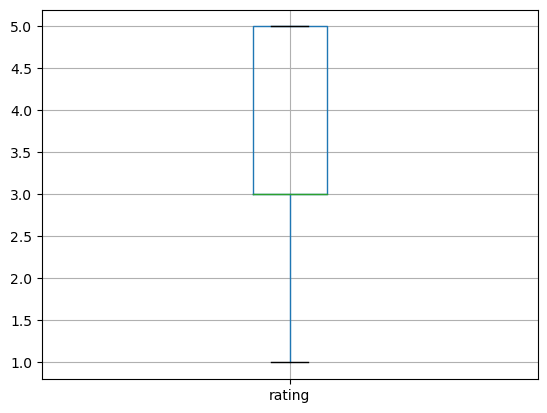

In [37]:
#Boxplot polarity
boxplot = df.boxplot(column=['rating'])

In [38]:
# fare il barplot
print(df['rating'].value_counts()[1])
print(df['rating'].value_counts()[2])
print(df['rating'].value_counts()[3])
print(df['rating'].value_counts()[4])
print(df['rating'].value_counts()[5])


3816
4050
10496
4664
9848


media caratteri recensioni positive: 445.2718733129386
media caratteri recensioni negative: 739.7723150879493


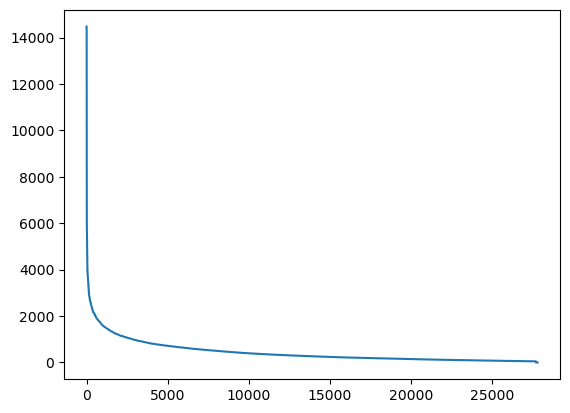

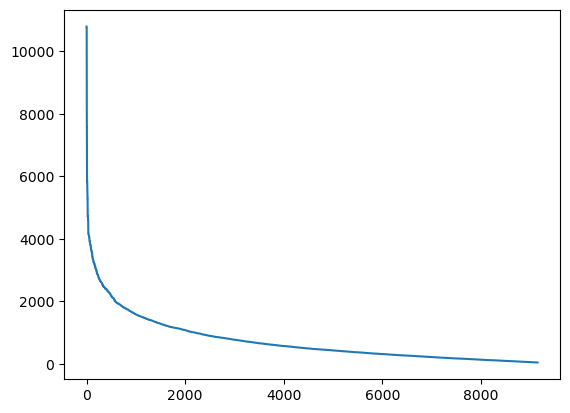

In [17]:
#lunghezza media recensioni positive e negative

reviews_len_pos = []
reviews_len_neg = []
for rec in df[df["feedback"] == 1]["verified_reviews"]:
    reviews_len_pos.append(len(rec))

mean_pos = sum(reviews_len_pos)/len(reviews_len_pos)

for rec in df[df["feedback"] == 0]["verified_reviews"]:
    reviews_len_neg.append(len(rec))

mean_neg = sum(reviews_len_neg)/len(reviews_len_neg)

print("media caratteri recensioni positive:", mean_pos)
print("media caratteri recensioni negative:", mean_neg)

plt.plot(sorted(reviews_len_pos, reverse=True))
plt.show()
plt.plot(sorted(reviews_len_neg, reverse=True))
plt.show()

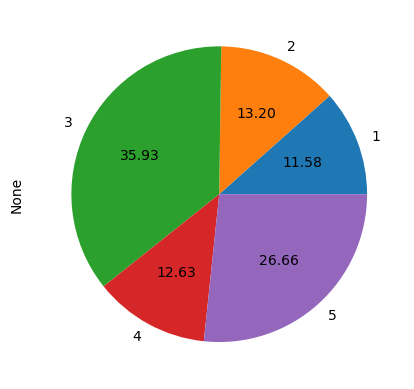

In [18]:
#piechart division
df.groupby('rating').size().plot(kind='pie', autopct='%.2f')
plt.show()

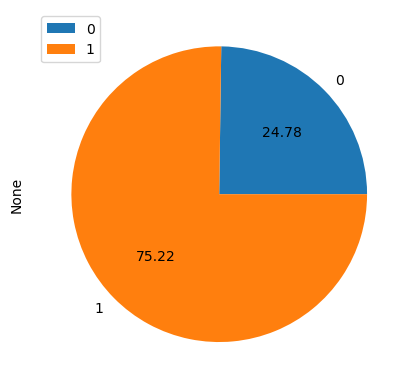

In [19]:
#piechart division
df.groupby('feedback').size().plot(kind='pie', autopct='%.2f')
plt.legend()
plt.show()

In [17]:
# stampa il numero di feedback divisi fra [0, 1]
print(df['feedback'].value_counts()[1],
df['feedback'].value_counts()[0])

21096 1294


In [17]:
from wordcloud import WordCloud
import math
from operator import itemgetter
from PIL import Image 
import PIL 

In [18]:
import re
import nltk
from nltk.corpus import stopwords
#nltk.download('stopwords')
from nltk.tokenize import word_tokenize

In [19]:
stop = stopwords.words('english')
def process_text(text, stem=False): #clean text
    """La funzione processa del testo preso in input"""
    text = re.sub('[^A-Za-z]', ' ', text.lower()) #remove non-alphabets
    tokenized_text = word_tokenize(text) #tokenize
    lemmatizer = nltk.stem.WordNetLemmatizer()
    clean_text = [
            lemmatizer.lemmatize(word) for word in tokenized_text
         if not word in stop and len(word)>2
    ] #creo una lista con le parole piene

    return clean_text

In [20]:
# popola il dizionario con i tokens e le frequenze divise per feedback [0, 1]
for k in data_dict:
    tokens = process_text(data_dict[k]["text"])
    data_dict[k]["tokens"] = tokens
    data_dict[k]["freq"] = nltk.FreqDist(tokens)

In [21]:
data_dict[0]["freq"].most_common(10)

[]

In [22]:
# processa il testo delle recensioni e lo appende al dataframe
df['verified_reviews']=df['verified_reviews'].apply(lambda x: process_text(x))

In [23]:
#genera la stringa totale di testo, quindi unisce tutte le recensioni sia negative che positive

tot_text = ""
for review in df['verified_reviews']:
    for w in review:
        tot_text+= " " + w
        
wordcloud = WordCloud(width = 800, height = 500, 
                background_color ='white', 
                min_font_size = 10).generate(tot_text)

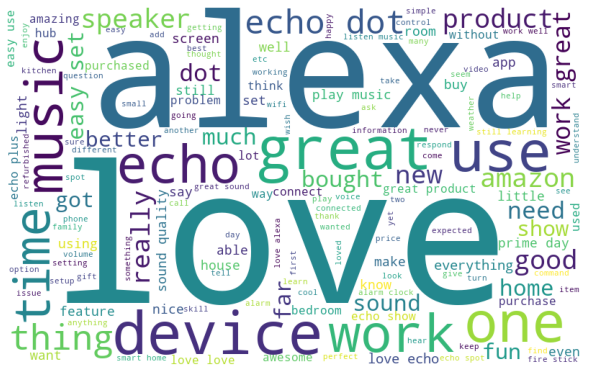

In [24]:
plt.figure(figsize = (8, 8), facecolor = None)
plt.imshow(wordcloud)
plt.axis("off")
plt.tight_layout(pad = 0) 
plt.show()

In [25]:
#aggiunge tutto il testo nel dizionario, lo si accede con la chiave "total_text"
data_dict["total_text"] = {}
data_dict["total_text"]["text"] = tot_text
data_dict["total_text"]["tokens"] = process_text(data_dict["total_text"]["text"])
data_dict["total_text"]["freq"] = nltk.FreqDist(data_dict["total_text"]["tokens"])


<AxesSubplot:>

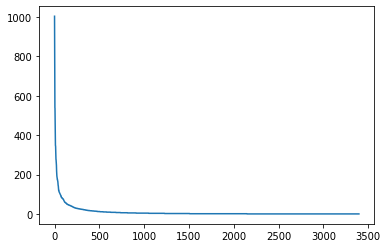

In [26]:
#plotta la distribuzione delle frquenze dei token
import seaborn as sns

lista_freq = [data_dict["total_text"]["freq"][x] for x in data_dict["total_text"]["freq"]]
sns.lineplot(data = lista_freq)

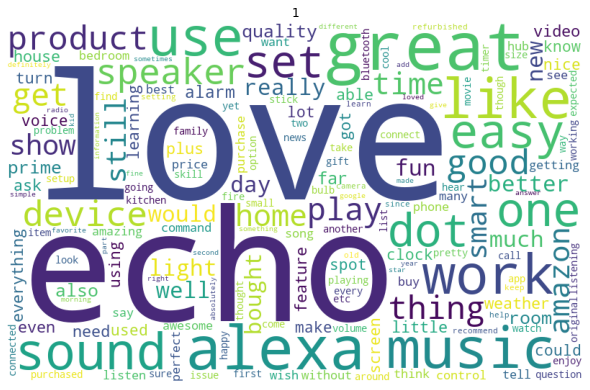

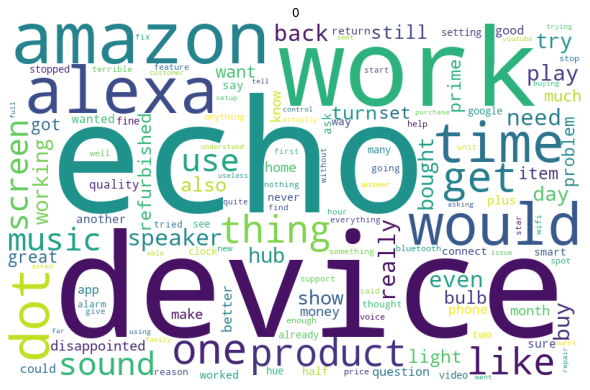

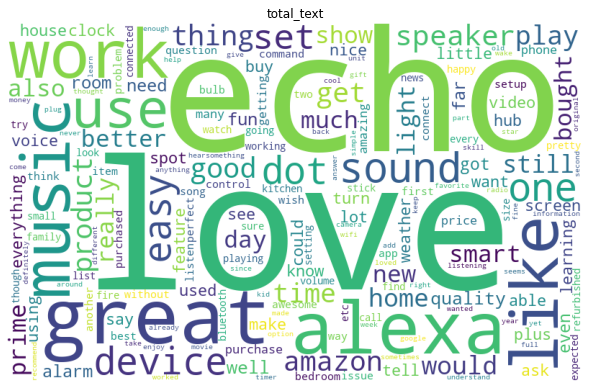

In [27]:
#genera una wordcloud per ogni feedback [0, 1]

for k in data_dict:
    wordcloud = WordCloud(width = 800, height = 500, 
                          background_color ='white', min_font_size = 10).generate_from_frequencies(data_dict[k]["freq"])
    plt.figure(figsize = (8, 8), facecolor = None)
    plt.title(k)
    plt.imshow(wordcloud)
    plt.axis("off")
    plt.tight_layout(pad = 0) 
    plt.show()

In [50]:
for k in data_dict:
    print("Il numero di token per", k, "è", len(data_dict[k]["tokens"]))

Il numero di token per 1 è 33710
Il numero di token per 0 è 4904
Il numero di token per total_text è 38534


In [52]:
for k in data_dict:
    print("Il numero di parole tipo per", k, "è", len(set(data_dict[k]["tokens"])))
    print("La ttr per", k, "è", len(set(data_dict[k]["tokens"]))/len(data_dict[k]["tokens"]))

Il numero di parole tipo per 1 è 3075
La ttr per 1 è 0.0912192227825571
Il numero di parole tipo per 0 è 1318
La ttr per 0 è 0.2687601957585644
Il numero di parole tipo per total_text è 3397
La ttr per total_text è 0.0881559142575388


In [ ]:
df["variation"].value_counts()

In [ ]:
ax = sns.countplot(x="rating", data=black)

In [ ]:
df["feedback"].value_counts()

In [ ]:
len(df)

Date di raccolta delle recensioni

In [39]:
print(min(df["date"]))
print(max(df["date"]))

April 1, 2020
September 9, 2022


In [ ]:
ax = sns.countplot(x="feedback", data=df)

In [ ]:
ax = sns.countplot(x="variation", data=df)

In [ ]:
ax = sns.countplot(x="rating", data=df)

In [ ]:
df["variation"].value_counts()

In [ ]:
for i in ["Black  Dot", "Charcoal Fabric ", "Configuration: Fire TV Stick", "Black  Plus", "Black  Show", "Black", "Black  Spot", "White  Dot", "Heather Gray Fabric ", "White  Spot", "White", "Sandstone Fabric ", "White  Show", "White  Plus", "Oak Finish ", "Walnut Finish " ]:
    tmp = df[df["variation"] == i]["variation"].count()
    print("Number of " + i + " reviews = " + str(tmp))
    print('\t\t' + "  Percertage = " + str(tmp/len(df) * 100))

In [ ]:
counts = df["variation"].value_counts()
counts.plot(kind = "bar",figsize=(8,6),title = "Variation")
plt.pyplot.xlabel('Variation', fontsize=10)
plt.pyplot.ylabel('No. of reviews', fontsize=10)

In [ ]:
pd.crosstab(index = df["variation"],columns = df["rating"]).plot(kind='bar',
                figsize=(15, 9),rot=0,stacked=True,title="Rating")

In [ ]:
import datetime

df['date'] = pd.to_datetime(df['date'])
df['day'] = df['date'].dt.strftime('%d')
df['months'] = df['date'].dt.strftime('%m')
df['year'] = df['date'].dt.strftime('%Y')

In [ ]:
pd.crosstab(index = df["months"],columns = df["rating"]).plot(kind='bar',
                figsize=(15, 7),rot=0,stacked=True,title="Rating")

In [ ]:
df.hist(figsize=(20,10))

In [ ]:
import plotly.express as px

In [ ]:
# Create the chart:
fig = px.parallel_coordinates(
    df, 
    color="feedback", 
    labels={"feedback": "feedback", "rating": "rating", },
    color_continuous_scale=px.colors.diverging.Tealrose,
    color_continuous_midpoint=2)

# Hide the color scale that is useless in this case
fig.update_layout(coloraxis_showscale=False)

# Show the plot
fig.show()

In [ ]:
df['months'].value_counts()

In [ ]:
plt.rcParams["figure.figsize"] = (20,5)
# create random data
names='July', 'June', 'May',
values=[2913,155,82]
 
# Label distance: gives the space between labels and the center of the pie
colors = ['#8EB897', '#B7C3F3', '#DD7596']
plt.pie(values, labels=names, labeldistance=1.15, wedgeprops = { 'linewidth' : 3, 'edgecolor' : 'white' }, colors=colors);
plt.show();